In [1]:
pip install segment-anything-py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 74.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nv

In [2]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-11-13 05:40:35--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.225.143.122, 13.225.143.109, 13.225.143.54, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.225.143.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   328MB/s    in 7.5s    

2025-11-13 05:40:43 (326 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 88.8 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [5]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])
        
        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84 
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84 
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8) 
        mask = (mask > 0.5).float()  
        return image, mask
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:    
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)
        
        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0039, 0.1098, 0.1059,  ..., 0.3647, 0.3255, 0.3137],
         [0.0863, 0.0706, 0.0980,  ..., 0.3529, 0.3647, 0.3451],
         [0.1294, 0.0000, 0.1020,  ..., 0.3412, 0.3529, 0.3725],
         ...,
         [0.2431, 0.2078, 0.1176,  ..., 0.3961, 0.4627, 0.3765],
         [0.1647, 0.1529, 0.1490,  ..., 0.5020, 0.6353, 0.6157],
         [0.0078, 0.0000, 0.0510,  ..., 0.4667, 0.5255, 0.5647]],

        [[0.0157, 0.0980, 0.0824,  ..., 0.2118, 0.2157, 0.2353],
         [0.0902, 0.0431, 0.1020,  ..., 0.1922, 0.2157, 0.2039],
         [0.1294, 0.0000, 0.0392,  ..., 0.1451, 0.2000, 0.2118],
         ...,
         [0.2000, 0.1804, 0.1412,  ..., 0.3490, 0.4118, 0.3529],
         [0.1725, 0.1569, 0.1059,  ..., 0.4745, 0.5608, 0.5216],
         [0.0235, 0.0078, 0.0353,  ..., 0.4000, 0.4588, 0.5059]],

        [[0.0431, 0.0549, 0.0510,  ..., 0.1882, 0.1961, 0.2118],
         [0.0745, 0.0157, 0.0471,  ..., 0.2078, 0.1804, 0.2039],
         [0.0902, 0.0078, 0.0118,  ..., 0.2235, 0.1804, 0.

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0  
            else:
                iou = 0.0  
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [26]:
from torchvision.ops import masks_to_boxes

def box_from_mask(mask):
    orig_shape = mask.shape 

    if mask.dim() == 4 and mask.shape[1] == 1:
        mask = mask.squeeze(1) 

    bin_mask = mask > 0.5 

    valid_mask = []
    for m in bin_mask:
        if m.sum() == 0:
            valid_mask.append(m.new_zeros(m.shape))
        else:
            valid_mask.append(m)

    valid_mask = torch.stack(valid_mask)

    if valid_mask.sum() == 0:
        B, C, H, W = orig_shape
        box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
    else:
        box = masks_to_boxes(valid_mask)
        if box.numel() == 0: 
            B, C, H, W = orig_shape
            box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
        else:
            box = box.unsqueeze(1)

    return box

In [27]:
def preprocess_image(images, transform, device):
    process_images = []
    for img in images:
        img = img.permute(1, 2, 0).cpu().numpy()
        img_resize = transform.apply_image(img)
        img_resize = torch.as_tensor(img_resize, dtype = torch.float32).permute(2, 0, 1) / 255.0
        process_images.append(img_resize)
    return torch.stack(process_images).to(device)

In [28]:
!pip install optuna

In [29]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
import optuna
from tqdm import tqdm
import warnings
from segment_anything.utils.transforms import ResizeLongestSide

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, transform, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr = 0.0001)

    num_epoch = 25
    
    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    best_val_loss = float('inf')
    trigger = 0
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0
        num_batches = 0

        for images, masks, _, _ in tqdm(train_loader):
            images = preprocess_image(images, transform, device)
            masks = masks.to(device)

            optimizer.zero_grad()
            image_embeddings = model.image_encoder(images)
            box = box_from_mask(masks).to(device)

            sparse_embeddings, dense_embeddings = model.prompt_encoder(points = None, boxes = box, masks = None)
            low_res_masks, _ = model.mask_decoder(
                image_embeddings = image_embeddings,
                image_pe = model.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings = sparse_embeddings,
                dense_prompt_embeddings = dense_embeddings,
                multimask_output = False
            )

            preds = torch.sigmoid(low_res_masks)
            masks_resized = F.interpolate(masks, size = preds.shape[-2:], mode = "bilinear", align_corners = False)
            masks_resized = (masks_resized > 0.5).float()

            loss = loss_func(preds, masks_resized)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(preds, masks_resized)
            num_batches += 1

        avg_loss = total_loss / num_batches
        avg_iou = total_iou / num_batches
        
        print(f"Epoch {epoch+1}/{num_epoch}")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")
        
        model.eval()
        val_total_loss = 0
        val_total_iou = 0
        val_num_batches = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images = preprocess_image(val_images, transform, device)
                val_masks = val_masks.to(device)

                val_embeddings = model.image_encoder(val_images)
                val_box = box_from_mask(val_masks).to(device)
                val_sparse_embeddings, val_dense_embeddings = model.prompt_encoder(points = None, boxes = val_box, masks = None)

                val_low_res_masks, _ = model.mask_decoder(
                    image_embeddings = val_embeddings,
                    image_pe = model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings = val_sparse_embeddings,
                    dense_prompt_embeddings = val_dense_embeddings,
                    multimask_output = False
                )

                val_preds = torch.sigmoid(val_low_res_masks)
                val_masks_resized = F.interpolate(val_masks, size = val_preds.shape[-2:], mode = "bilinear", align_corners = False)
                val_masks_resized = (val_masks_resized > 0.5).float()

                val_loss = loss_func(val_preds, val_masks_resized)
                val_total_loss += val_loss.item()
                val_total_iou += calc_iou(val_preds, val_masks_resized)
                val_num_batches += 1

        val_avg_loss = val_total_loss / val_num_batches
        val_avg_iou = val_total_iou / val_num_batches

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()
        
        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [30]:
import gc

fine_tune_sam_model = None

def objective(trial):
    global fine_tune_sam_model
    torch.cuda.empty_cache()
    gc.collect()
    
    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7)])

    sam_model = sam_model_registry["vit_h"](checkpoint = "sam_vit_h_4b8939.pth").to(device)

    for name, param in sam_model.named_parameters():
        param.requires_grad = False
        if "mask_decoder" in name or "prompt_encoder" in name:
            param.requires_grad = True
    
    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")
    
    transform = ResizeLongestSide(sam_model.image_encoder.img_size)

    model, val_loss = train_model(
        model = sam_model,
        train_loader = train_loader,
        val_loader = val_loader,
        transform = transform,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_sam_model = model

    torch.cuda.empty_cache()
    gc.collect()
    
    return val_loss

In [31]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-13 05:41:15,432] A new study created in memory with name: no-name-813f6425-bbd0-47d3-b03d-f331f34647ab


Trial 0: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.16579129546880722, Train Avg IoU: 0.5094393240546601



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15094759066899618, Val Avg IoU: 0.5344160346107351



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.1558036354318675, Train Avg IoU: 0.5291343313357275



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15088587544030613, Val Avg IoU: 0.5396902424593767



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.1533230966888368, Train Avg IoU: 0.5365518346273651



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15100864445169768, Val Avg IoU: 0.537586028377215



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.15265472041856912, Train Avg IoU: 0.5592479632986296



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15148125257756975, Val Avg IoU: 0.6161052477028635



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.1531537511230757, Train Avg IoU: 0.6370181426561127



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1495097374750508, Val Avg IoU: 0.5837914281421237



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.15250650808836022, Train Avg IoU: 0.6143748092775544



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14942907045284906, Val Avg IoU: 0.6107994098630216



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.15246559526874787, Train Avg IoU: 0.6021940844236977



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14829814847972658, Val Avg IoU: 0.6240657882557975



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.15287226407478252, Train Avg IoU: 0.6461642948496673



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14951538170377413, Val Avg IoU: 0.6519467433293661



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.15113471013804278, Train Avg IoU: 0.62944906246331



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14868021797802713, Val Avg IoU: 0.5967373930745654



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.1514030727557838, Train Avg IoU: 0.6249620399644805



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14832158635059992, Val Avg IoU: 0.6014796338147588



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.1510985002646016, Train Avg IoU: 0.6168744275346398



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1484767740799321, Val Avg IoU: 0.5993845404850112



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.15031345527515644, Train Avg IoU: 0.6373514268650777



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14930128264758322, Val Avg IoU: 0.6220522133840455



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.1508163287718263, Train Avg IoU: 0.6362688287885653



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14839307011829483, Val Avg IoU: 0.6352302605907122



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.15077861910685897, Train Avg IoU: 0.6452948006594347



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14936674593223465, Val Avg IoU: 0.6313643513454331



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.150393170149376, Train Avg IoU: 0.6313220455000798



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14982081370221245, Val Avg IoU: 0.618771616783407



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.15026562241837382, Train Avg IoU: 0.6384905070687333



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14994283020496368, Val Avg IoU: 0.6315076831314299



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.15032468182552192, Train Avg IoU: 0.6409633067539997



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]
[I 2025-11-13 06:33:42,693] Trial 0 finished with value: 0.14829814847972658 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.14829814847972658.


Val loss: 0.14862406212422583, Val Avg IoU: 0.6219282978110843

Stop at epoch 17
Trial 1: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.16438347929053837, Train Avg IoU: 0.5231946183679005



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15175809007551935, Val Avg IoU: 0.5405620324114958



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.1550004503482746, Train Avg IoU: 0.5633057306986302



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1511113949947887, Val Avg IoU: 0.5889370582169957



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.1535067803019451, Train Avg IoU: 0.5725972462031577



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15070959884259436, Val Avg IoU: 0.5845977796448601



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.15304920333437622, Train Avg IoU: 0.5631272457798736



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15078062688310942, Val Avg IoU: 0.5664883802334467



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.15223755904783806, Train Avg IoU: 0.5696118241822761



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1492240619328287, Val Avg IoU: 0.5756068958176507



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.1526988194220596, Train Avg IoU: 0.6081820979662653



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15063749377926192, Val Avg IoU: 0.6331249549984932



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.15215951349172327, Train Avg IoU: 0.6282509630028572



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14888689832554924, Val Avg IoU: 0.6044418935974439



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.15183144541353816, Train Avg IoU: 0.6246716717465056



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14918889312280548, Val Avg IoU: 0.6360944310824076



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.1518811077500383, Train Avg IoU: 0.6317701058255302



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14917969248361057, Val Avg IoU: 0.6017661434080865



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.15106422438596687, Train Avg IoU: 0.6257847081869841



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14887678581807348, Val Avg IoU: 0.6389254911078347



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.15101338801388112, Train Avg IoU: 0.6512320338127514



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14951327360338634, Val Avg IoU: 0.6183104142546654



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.15062458282853994, Train Avg IoU: 0.6286543110230317



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1515207514166832, Val Avg IoU: 0.6524240929219458



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.15125704986146754, Train Avg IoU: 0.6247903073930906



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14964709555109343, Val Avg IoU: 0.6345388955540128



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.15081892090125215, Train Avg IoU: 0.6173185932760438



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15070706895656055, Val Avg IoU: 0.6218418834937943



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.1503139395887653, Train Avg IoU: 0.6338337855413556



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14943968380490938, Val Avg IoU: 0.6277547197209464



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.15017775143496692, Train Avg IoU: 0.6351274118448297



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14893636893894938, Val Avg IoU: 0.6159543933139907



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.14979003726815185, Train Avg IoU: 0.6387605022432076



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14918817207217216, Val Avg IoU: 0.6180862536032995



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.15003120728457967, Train Avg IoU: 0.6434318729572825



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14948425773117277, Val Avg IoU: 0.617336980584595



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.14991858172126943, Train Avg IoU: 0.6407105330791738



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14870095004638037, Val Avg IoU: 0.61194258224633



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.14966866648238566, Train Avg IoU: 0.649548092029161



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14861390988032022, Val Avg IoU: 0.6250207134419017



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.15029427409172058, Train Avg IoU: 0.6462904753473898



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14924726428257096, Val Avg IoU: 0.6517962920996878



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.15073554838697115, Train Avg IoU: 0.6453720961386958



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1489478349685669, Val Avg IoU: 0.6209285747673776



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.15027188644227055, Train Avg IoU: 0.6612410518961648



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1494407955971029, Val Avg IoU: 0.6621703513794475



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 24/25
Train loss: 0.149856669207414, Train Avg IoU: 0.6565380165767338



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14855005840460458, Val Avg IoU: 0.645627627770106



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 25/25
Train loss: 0.14962662761617038, Train Avg IoU: 0.6472764057624671



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1490565948188305, Val Avg IoU: 0.64410050958395



[I 2025-11-13 07:50:47,014] Trial 1 finished with value: 0.14855005840460458 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.14829814847972658.


Trial 2: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.16599496521262658, Train Avg IoU: 0.526700909430575



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15707197868161732, Val Avg IoU: 0.5520649417820904



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.15686887585454518, Train Avg IoU: 0.5401550346157618



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15050608664751053, Val Avg IoU: 0.5429757378167577



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.1526034445915785, Train Avg IoU: 0.5542784331030108



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1507384797765149, Val Avg IoU: 0.5685078812142214



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.15237339767110017, Train Avg IoU: 0.5489073884932117



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14845208202799162, Val Avg IoU: 0.548487201333046



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.15234233733887473, Train Avg IoU: 0.5786917006545182



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1518960702750418, Val Avg IoU: 0.6447741281655099



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.1516668489202857, Train Avg IoU: 0.6221226174384356



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14984949926535288, Val Avg IoU: 0.5918312759863006



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.15144890024223262, Train Avg IoU: 0.6069802868231717



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14981302660372522, Val Avg IoU: 0.5978886187076569



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.15186320840277606, Train Avg IoU: 0.608508351401219



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15004262824853262, Val Avg IoU: 0.6291320804092619



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.15072494776298603, Train Avg IoU: 0.6258955485601392



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14936114019817776, Val Avg IoU: 0.5999561780028873



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.1510097960320612, Train Avg IoU: 0.6117800714758536



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14936777452627817, Val Avg IoU: 0.6289768069982529



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.15062148230046862, Train Avg IoU: 0.6264912769612339



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1494079153570864, Val Avg IoU: 0.6215848078330358



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.15091690333146188, Train Avg IoU: 0.6294253971945081



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14838770570026505, Val Avg IoU: 0.6230013022820154



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.15059014404606488, Train Avg IoU: 0.6278206950777935



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14818418895204863, Val Avg IoU: 0.6140769066082107



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.15034720260235998, Train Avg IoU: 0.6241734112457683



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14942428386873668, Val Avg IoU: 0.5993844593564669



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.15103241314904559, Train Avg IoU: 0.6187010932092866



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1483847155339188, Val Avg IoU: 0.6242237413922945



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.150554565143668, Train Avg IoU: 0.6302558386491405



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14833814899126688, Val Avg IoU: 0.5941884335544374



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.15029683553924164, Train Avg IoU: 0.6177977579645813



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1482652947306633, Val Avg IoU: 0.6060958438449435



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.15006781198705235, Train Avg IoU: 0.6317056729458272



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14850161721309027, Val Avg IoU: 0.6105146813723776



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.15001793526526955, Train Avg IoU: 0.6254880964342091



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14822700081600082, Val Avg IoU: 0.6147296014759276



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.15032966621220112, Train Avg IoU: 0.6389312121448003



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14862011704179975, Val Avg IoU: 0.6198033740123113



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.14971080262006986, Train Avg IoU: 0.6374896122142673



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1484867682059606, Val Avg IoU: 0.5998743582102988



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.15021390059135026, Train Avg IoU: 0.6214752060671648



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14866483294301563, Val Avg IoU: 0.6162056649724642



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.14984568257609177, Train Avg IoU: 0.6312547121196985



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14847368167506325, Val Avg IoU: 0.6096623159117169

Stop at epoch 23


[I 2025-11-13 09:01:38,412] Trial 2 finished with value: 0.14818418895204863 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 2 with value: 0.14818418895204863.


In [32]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}
Best val loss: 0.14818418895204863


In [33]:
fine_tune_sam_model.eval()

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [34]:
def ref_point(gt_mask):
    index = np.argwhere(gt_mask > 0)

    if len(index) > 0:
        if len(index) < 500:
            num_points = 5
        elif len(index) < 2000:
            num_points = 10
        elif len(index) < 10000:
            num_points = 15
        elif len(index) < 30000:
            num_points = 20
        elif len(index) < 50000:
            num_points = 25
        else:
            num_points = 30

        num_points = min(len(index), num_points)
        random_index = np.random.choice(len(index), num_points, replace = False)
        point = index[random_index]
        return point[:, ::-1].astype(np.float32)
    else:
        return np.array([[128, 128]], dtype = np.float32)

In [35]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0
    
    iou = intersection / union

    return iou

In [36]:
predictor_fine_tune = SamPredictor(fine_tune_sam_model)

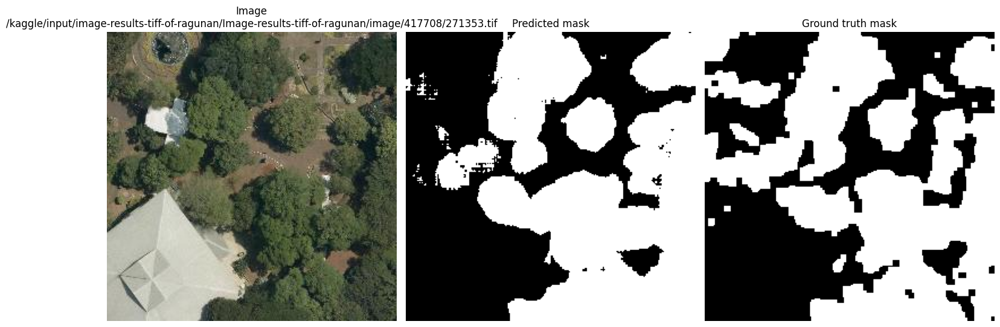

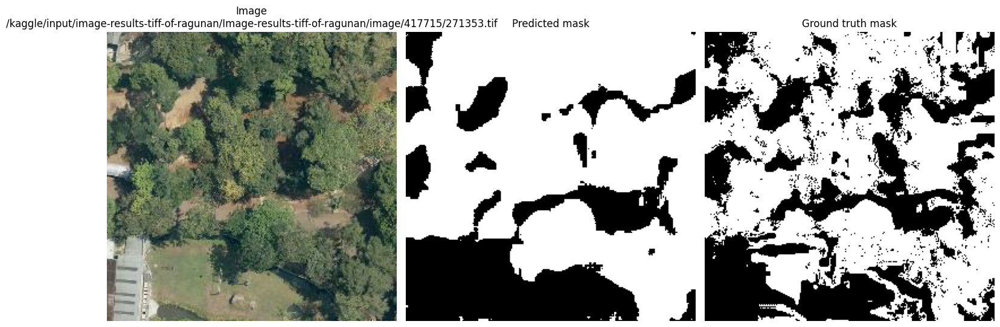

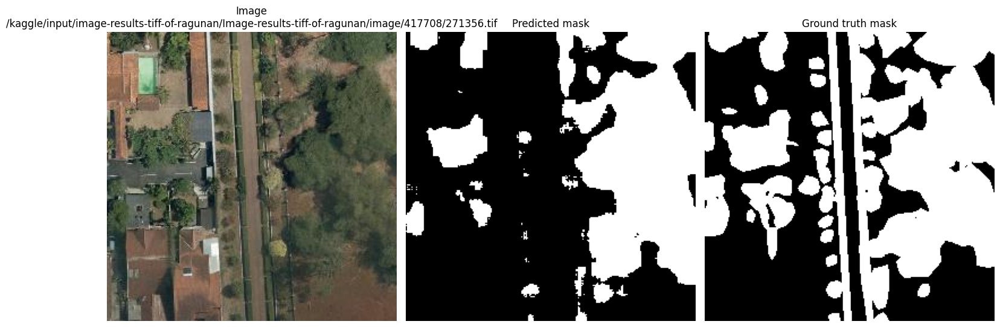

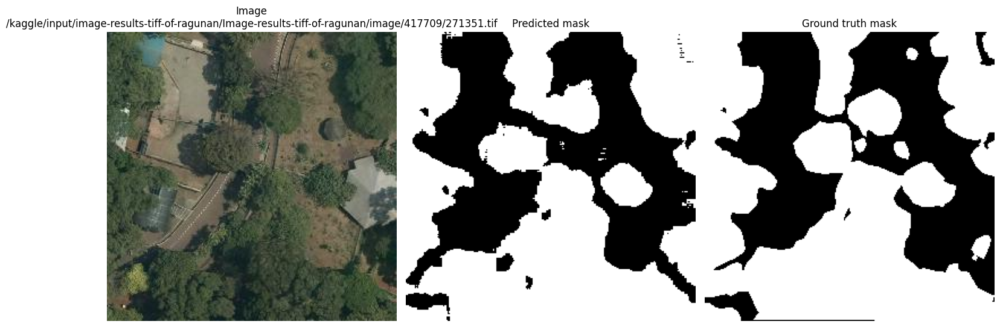

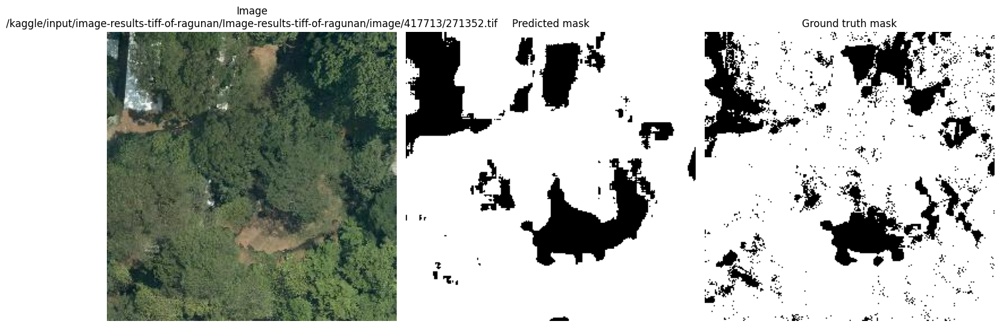

...

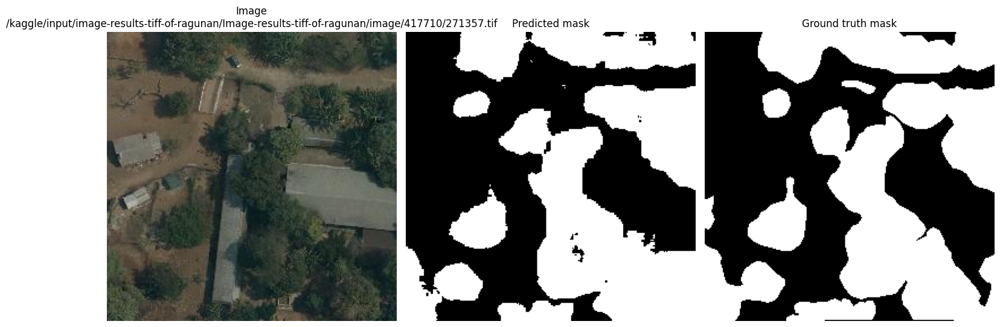

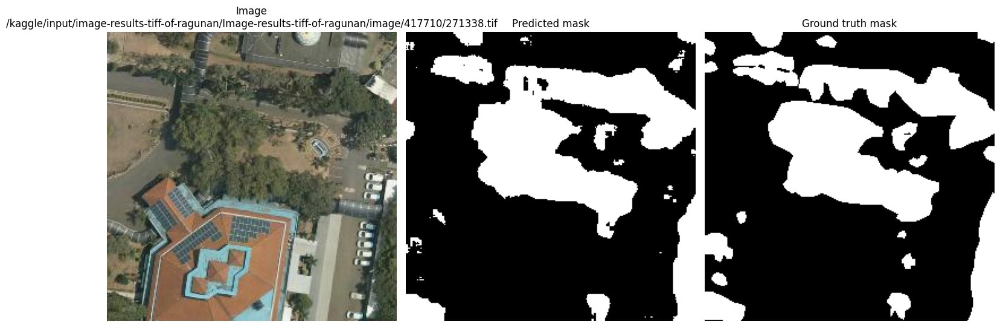

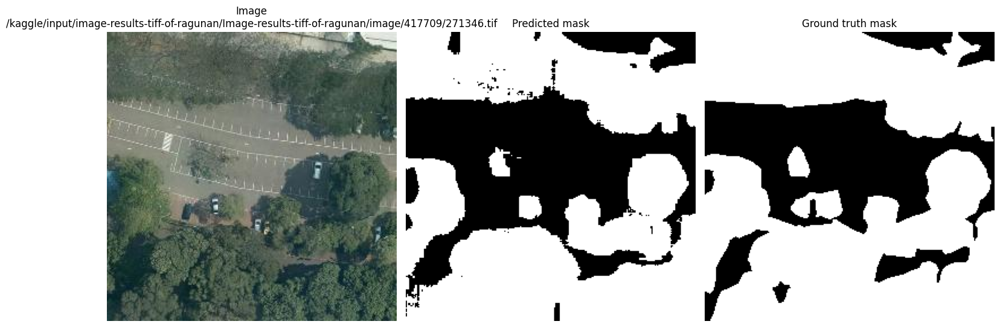

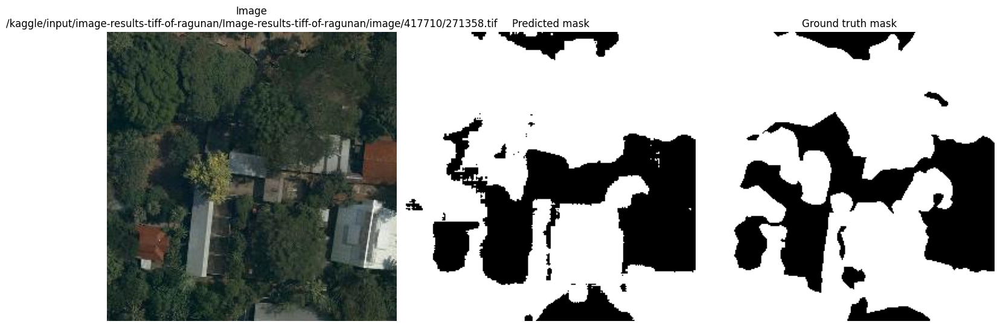

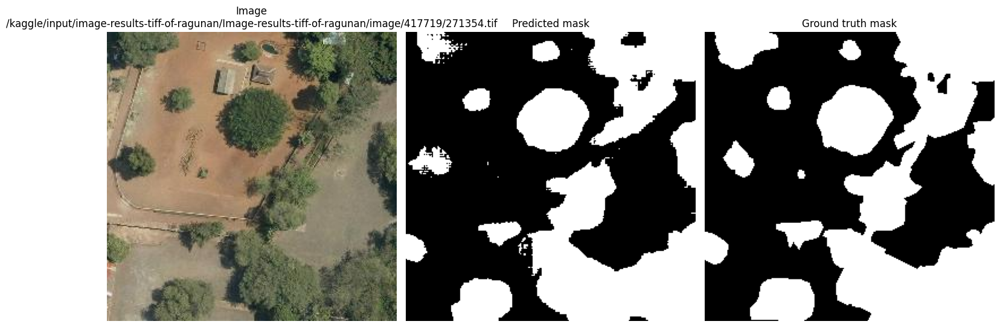

In [37]:
bin_masks = []
gt_masks = []
image_paths = []

for image, mask, image_path, mask_path in test_loader:
    for i in range(len(image_path)): 
        with rasterio.open(image_path[i]) as src:
            img = src.read([1, 2, 3])
            img = np.transpose(img, (1, 2, 0)) 

        gt_mask = cv2.imread(mask_path[i], cv2.IMREAD_GRAYSCALE)

        predictor_fine_tune.set_image(img)

        point = ref_point(gt_mask) 
        if len(point) == 0:
            print(f"No ref points in {mask_path[i]}")
            continue
            
        label = np.ones(len(point), dtype = np.int32)

        masks_fine_tune, scores, logits = predictor_fine_tune.predict(
            point_coords = point, point_labels = label, multimask_output = True
        )

        best_mask = masks_fine_tune[np.argmax(masks_fine_tune.sum(axis = (1, 2)))]
        best_mask = np.clip(best_mask, 0, 1)
        best_mask = (best_mask * 255).astype(np.uint8)

        _, bin_mask = cv2.threshold(best_mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        gt_masks.append(gt_mask)
        bin_masks.append(bin_mask)
        image_paths.append(image_path[i])

        plt.figure(figsize = (15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title(f"Image\n{image_path[i]}")
        plt.axis("off")
    
        plt.subplot(1, 3, 2)
        plt.imshow(bin_mask, cmap = "gray")
        plt.title("Predicted mask")
        plt.axis("off")
    
        plt.subplot(1, 3, 3)
        plt.imshow(gt_mask, cmap = "gray")
        plt.title("Ground truth mask")
        plt.axis("off")
    
        plt.tight_layout()
        plt.show()

In [38]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 34052
Vegetation coverage area: 19165.484195771052
IoU score: 0.7534074283220822
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 44599
Vegetation coverage area: 3465.6959603591376
IoU score: 0.7343212217390408
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 22714
Vegetation coverage area: 12784.118642744734
IoU score: 0.6115545532773509
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 38356
Vegetation coverage area: 21587.904141107552
IoU score: 0.8211130426499654
Image /kaggle/input/

In [51]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area  

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 19165.484195771052 m^2
Carbon density: 0.007614512329046875 ton/m^2
Estimated carbon stock: 145.93581570085172 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3465.6959603591376 m^2
Carbon density: 0.007614512329046875 ton/m^2
Estimated carbon stock: 26.389584618882605 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 12784.118642744734 m^2
Carbon density: 0.007614512329046875 ton/m^2
Estimated carbon stock: 97.34482902117777 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 21587.904141107552 m^2
Carbon density: 0.007614512329046875 ton/m^2
Estimated carbon stock: 164.38136224074555 ton
Image /kaggle/input/i